## Uber Data Analysis 

### 1.  Data Preparation

#### 1.1 Importing required modules 

In [126]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

#### 1.2 Data loading

In [3]:
import os
files = os.listdir(r'C:\Users\pulip\OneDrive\Desktop\Projects\Uber Data Analysis\uber-pickups-in-new-york-city')[-7:]

In [4]:
files.remove('uber-raw-data-janjune-15.csv')

In [5]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [6]:
#concatenate the data files and create a dataframe
path=r'C:\Users\pulip\OneDrive\Desktop\Projects\Uber Data Analysis\uber-pickups-in-new-york-city'
final=pd.DataFrame()
for file in files:
    df=pd.read_csv(path+"/"+file,encoding='utf-8')
    final=pd.concat([final,df])

In [7]:
final.shape


(4534327, 4)

#### 1.3 Data Preparation for Analysis:

In [8]:
df=final.copy()
df.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [9]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [10]:
#convert date/time format from object to datetime
df['Date/Time']=pd.to_datetime(df['Date/Time'], format='%m/%d/%Y %H:%M:%S')
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [11]:
df.head()

,Date/Time,Lat,Lon,Base
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512


In [12]:
df['weekday']=df['Date/Time'].dt.day_name()

In [13]:
#creating various columns for time and drilling down to day,month,minute etc.,- deriving attributes from a single feature

df['day']=df['Date/Time'].dt.day
df['minute']=df['Date/Time'].dt.minute
df['month']=df['Date/Time'].dt.month
df['hour']=df['Date/Time'].dt.hour

In [14]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


In [15]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
weekday              object
day                   int64
minute                int64
month                 int64
hour                  int64
dtype: object

In [136]:
df['weekday'].value_counts()

Thursday     755145
Friday       741139
Wednesday    696488
Tuesday      663789
Saturday     646114
Monday       541472
Sunday       490180
Name: weekday, dtype: int64

### 2. Exploration and data visualization

In [20]:
#!pip install plotly
#deployment level interactive visualizations

#### 2.1 Number of trips by weekday: 

In [129]:
import plotly.express as px
px.bar(x=df['weekday'].value_counts().index,
       y=df['weekday'].value_counts())


#the plot velow is interactive and hovering on the bars gives more information

In [132]:
min_trip_weekday = min(df['weekday'].value_counts())
min_trip_weekday

490180

rides were higher in number on Thursday and lower on Sunday

(array([216928., 103517., 227152., 543565., 324851., 366329., 819491.,
        660869., 579117., 692508.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <a list of 10 Patch objects>)

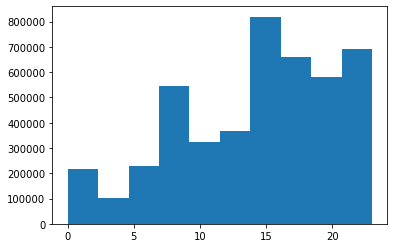

In [24]:
plt.hist(df['hour'])

 rides are peak during evening time. Eg: log off from work.

#### 2.2 Trips by month

In [27]:
#monthly ride analysis
df['month'].unique()

array([4, 8, 7, 6, 5, 9], dtype=int64)

In [29]:
for i,month in enumerate(df['month'].unique()):
    print(i)
    print(month)

0
4
1
8
2
7
3
6
4
5
5
9


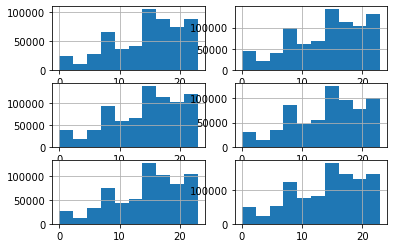

In [30]:
for i,month in enumerate(df['month'].unique()):
    plt.subplot(3,2,i+1)
    df[df['month']==month]['hour'].hist()

every month the rides are peak during evening time

In [33]:
#!pip install chart_studio

In [34]:
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [ ]:
#analysis on which month has maximum rides:

In [35]:
df.groupby('month')['hour'].count()

month
4     564516
5     652435
6     663844
7     796121
8     829275
9    1028136
Name: hour, dtype: int64

In [37]:
trace1=go.Bar( x=df.groupby('month')['hour'].count().index,
        y=df.groupby('month')['hour'].count(),
        name='Priority')

In [38]:
iplot([trace1])

 which month has maximum rides? 
graph clearly depicts that septemeber has maximum rides

#### 2.3 Trips by day

Text(0.5, 1.0, 'Rides by month-day')

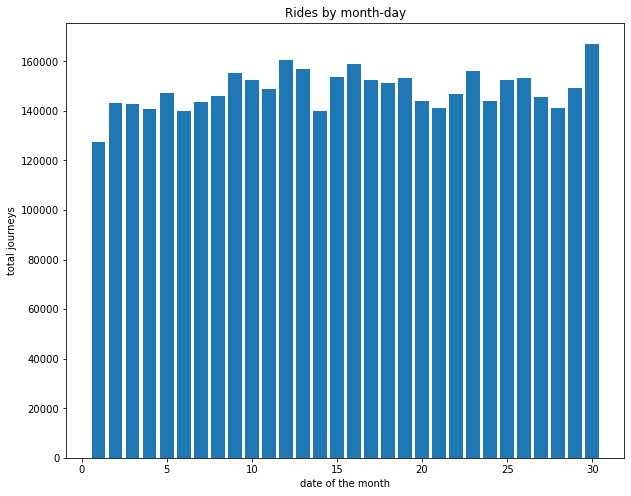

In [138]:
#Analysis of journey of each day
plt.figure(figsize=(10,8))
plt.hist(df['day'],bins=30, rwidth=0.8,range=(0.5,30.5))
plt.xlabel('date of the month')
plt.ylabel('total journeys')
plt.title('Rides by month-day')

 highest number of trips are on 30th rather than 31st because April, June and September has only 30 days.

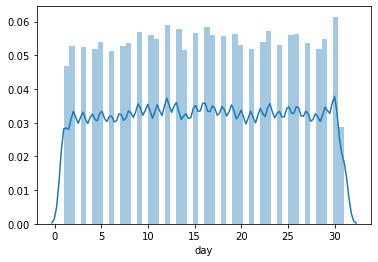

In [46]:
sns.distplot(df['day'])

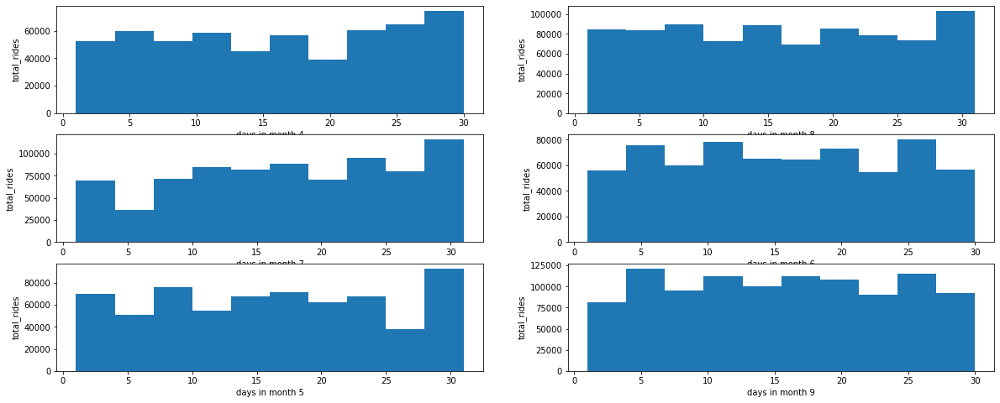

In [49]:
#Analysis of total rides every month
plt.figure(figsize=(20,8))

for i,month in enumerate(df['month'].unique(),1):
    plt.subplot(3,2,i)
    df_out=df[df['month']==month]
    plt.hist(df_out['day'])
    plt.xlabel('days in month {}'.format(month))
    plt.ylabel('total_rides')

#### 2.4 Trips by hour


NameError: name 'ax' is not defined

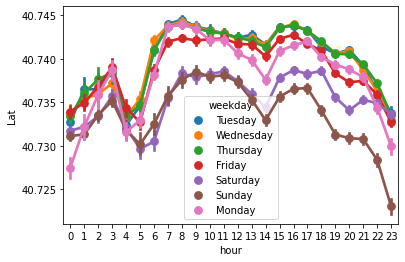

In [139]:
#Rush in hour
sns.pointplot(x='hour', y='Lat', data=df,hue='weekday')
ax.set_title('hoursoffday vs latitude of passenger')

 #### 2.5 Analyzing which base number gets popular by month

In [54]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


In [56]:
base = df.groupby(['Base','month'])['Date/Time'].count().reset_index()

In [57]:
base

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472
5,B02512,9,34370
6,B02598,4,183263
7,B02598,5,260549
8,B02598,6,242975
9,B02598,7,245597


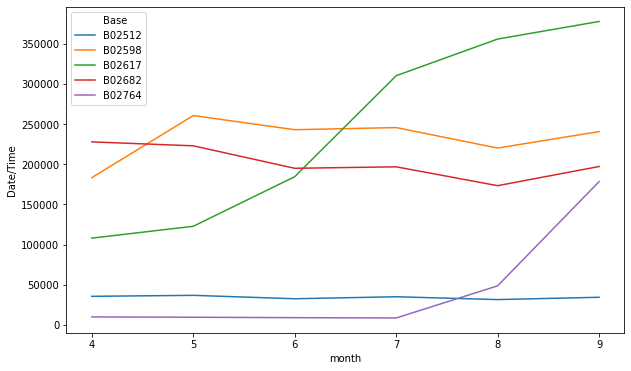

In [58]:
#which base is popular by month
plt.figure(figsize=(10,6))
sns.lineplot(x='month',y='Date/Time',hue='Base',data=base)

 B02617 get popular by month

### 3. Performing cross analysis

#### 3.1 Trips by hour and month

In [62]:
def count_rows(rows):
    return len(rows)

In [65]:
#heatmap by Hour and Weekday
#group data on basis of weekday and hour
cross=df.groupby(['weekday','hour']).apply(count_rows)
cross

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Length: 168, dtype: int64

In [67]:
#creating pivot table
pivot = cross.unstack()
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


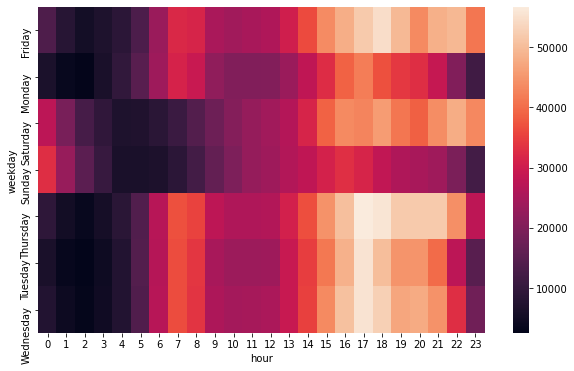

In [68]:
#heatmap
plt.figure(figsize=(10,6))
sns.heatmap(pivot)

evening time we can observe lot of rush

#### 3.2 Trips by hour and day

In [140]:
#function to create heat map 
def heatmap(col1,col2):
    cross=df.groupby([col1,col2]).apply(count_rows)
    pivot = cross.unstack()
    plt.figure(figsize=(10,6))
    return sns.heatmap(pivot)
    
    

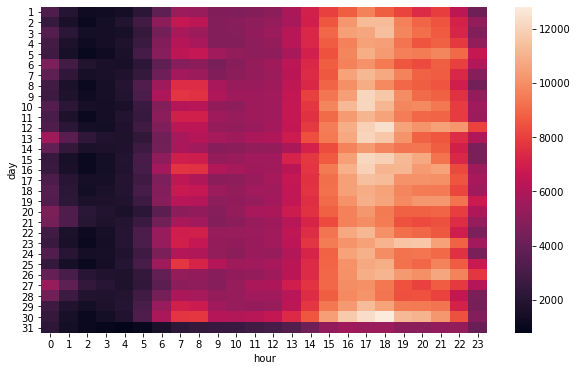

In [73]:
#Heatmap for Hour and Day
heatmap('day','hour')

every day every evening we can see rush and can conclude peak in evenings 

### 4. Spatial Analysis

In [76]:
#analysis of location data points - latitude and longitude

(40.5, 41.0)

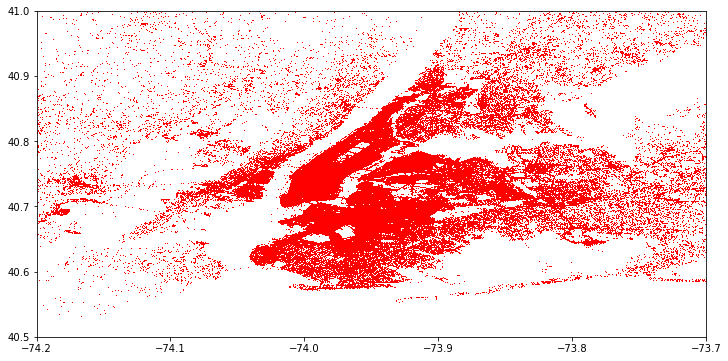

In [81]:
plt.figure(figsize=(12,6))
plt.plot(df['Lon'],df['Lat'], 'r+',ms=0.5)
plt.xlim(-74.2,-73.7)
plt.ylim(40.5,41)

In [82]:
#performing spatial analysis on Demand of Ubers using Heatmap


In [83]:
df_out=df[df['weekday']=='Sunday']

In [84]:
df_out.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
6965,2014-04-06 00:00:00,40.6547,-74.3033,B02512,Sunday,6,0,4,0
6966,2014-04-06 00:00:00,40.7356,-74.0006,B02512,Sunday,6,0,4,0
6967,2014-04-06 00:00:00,40.7421,-74.0041,B02512,Sunday,6,0,4,0
6968,2014-04-06 00:00:00,40.7401,-74.0053,B02512,Sunday,6,0,4,0
6969,2014-04-06 00:01:00,40.7368,-73.9877,B02512,Sunday,6,1,4,0


In [88]:
rush=df_out.groupby(['Lat','Lon'])['weekday'].count().reset_index()
rush

,Lat,Lon,weekday
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [89]:
#!pip install folium

In [93]:
from folium.plugins import HeatMap
import folium
basemap=folium.Map()

In [94]:
HeatMap(rush,zoom=20,radius=15).add_to(basemap)
basemap

In [95]:
#wherever count is higher, heat map will display higher density

In [96]:
#automating the analysis

In [99]:
def plot(df,day):
    basemap=folium.Map()
    df_out=df[df['weekday']==day]
    HeatMap(df_out.groupby(['Lat','Lon'])['weekday'].count().reset_index(),zoom=20,radius=15).add_to(basemap)
    return basemap
    

In [100]:
plot(df,'Saturday')

Manhattan having maximum rides

In [102]:
#Analyzing uber pick ups in each month

In [107]:

uber_15=pd.read_csv(r'C:\Users\pulip\OneDrive\Desktop\Projects\Uber Data Analysis\uber-pickups-in-new-york-city\uber-raw-data-janjune-15.csv')
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [109]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [110]:
uber_15['Pickup_date']=pd.to_datetime(uber_15['Pickup_date'], format='%Y-%m-%d %H:%M:%S')
uber_15['Pickup_date']

0          2015-05-17 09:47:00
1          2015-05-17 09:47:00
2          2015-05-17 09:47:00
3          2015-05-17 09:47:00
4          2015-05-17 09:47:00
                   ...        
14270474   2015-05-08 15:43:00
14270475   2015-05-08 15:43:00
14270476   2015-05-08 15:43:00
14270477   2015-05-08 15:44:00
14270478   2015-05-08 15:44:00
Name: Pickup_date, Length: 14270479, dtype: datetime64[ns]

In [112]:
uber_15['weekday']=uber_15['Pickup_date'].dt.day_name()
uber_15['day']=uber_15['Pickup_date'].dt.day
uber_15['minute']=uber_15['Pickup_date'].dt.minute
uber_15['month']=uber_15['Pickup_date'].dt.month
uber_15['hour']=uber_15['Pickup_date'].dt.hour
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,weekday,day,minute,month,hour
0,B02617,2015-05-17 09:47:00,B02617,141,Sunday,17,47,5,9
1,B02617,2015-05-17 09:47:00,B02617,65,Sunday,17,47,5,9
2,B02617,2015-05-17 09:47:00,B02617,100,Sunday,17,47,5,9
3,B02617,2015-05-17 09:47:00,B02774,80,Sunday,17,47,5,9
4,B02617,2015-05-17 09:47:00,B02617,90,Sunday,17,47,5,9


In [113]:
#Uber pickups wonthly-wise in NYC

In [116]:
px.bar(x=uber_15['month'].value_counts().index,
       y=uber_15['month'].value_counts())

In [117]:
#Analyzing rush in NYC

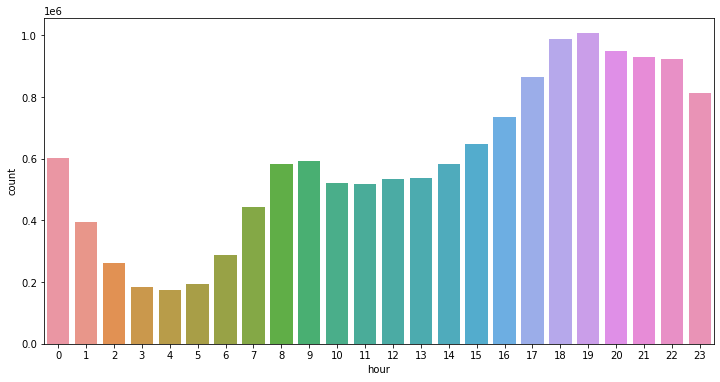

In [119]:
plt.figure(figsize=(12,6))
sns.countplot(uber_15['hour'])

In [121]:
summary=uber_15.groupby(['weekday','hour'])['Pickup_date'].count().reset_index()
summary.head()

,weekday,hour,Pickup_date
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


In [122]:
summary.columns=['weekday','hour','counts']
summary.head()

,weekday,hour,counts
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


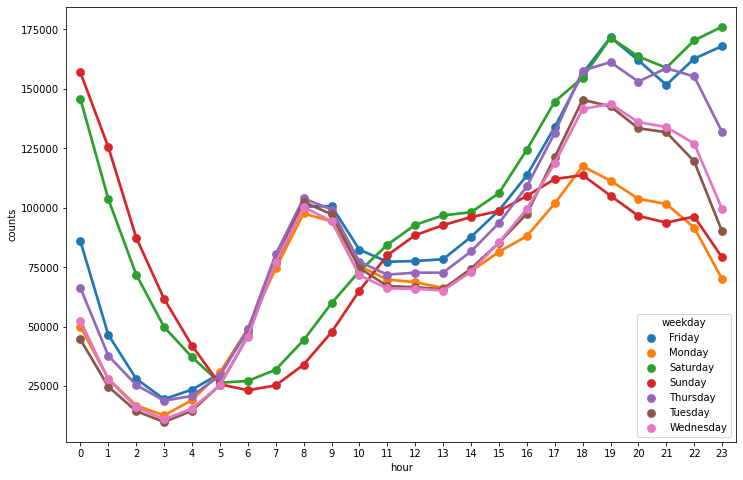

In [123]:
plt.figure(figsize=(12,8))
sns.pointplot(x='hour', y='counts', hue='weekday',data=summary)

saturday has the highest rush, specially in evening and weekday mornings are in rush compared to weekend mornings